In [10]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import pickle
from datetime import date
import time

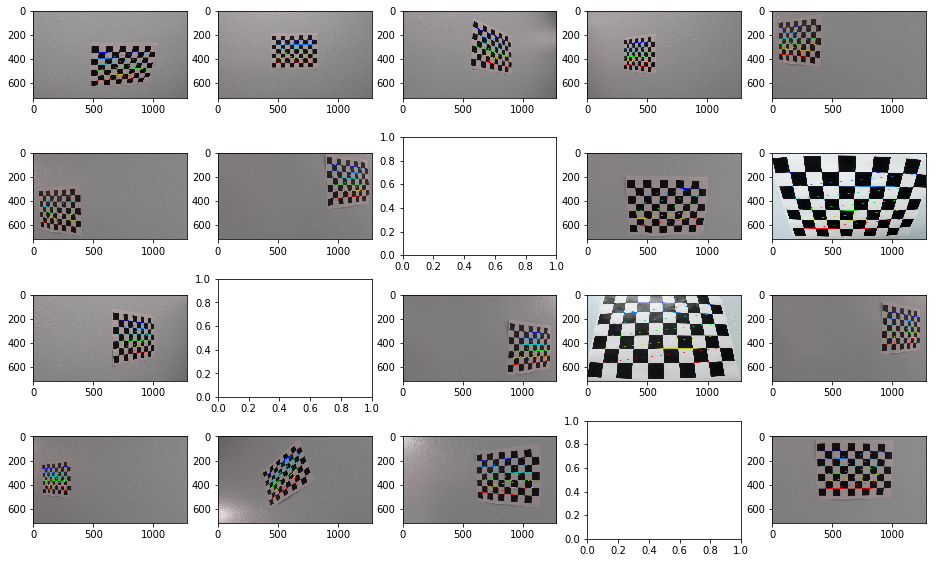

In [11]:
'''
This function calculates corners of the chessboard

Input: 
nx: the number of inside corners in x axis
ny: the number of inside corners in y axis

Output:
objpoints: Object points in 3D space
imgpoints: Image points in 2D space (aka Corners in the image)
'''
def calculate_chessboard_corners(nx, ny):
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    objpoints = []
    imgpoints = []

    input_dir = 'camera_cal/'
    output_dir= 'camera_cal_output/'
    f, ax = plt.subplots(4, 5, figsize=(16,10))
    ax = ax.ravel()
    for idx, fname in enumerate(os.listdir(input_dir)):

        img = cv2.imread(input_dir+fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        if ret == True:
            objpoints+=[objp]
            imgpoints+=[corners]
            # Draw and display the corners
            cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            ax[idx].imshow(img)
    plt.show()
    
    return objpoints, imgpoints
    

objpoints, imgpoints = calculate_chessboard_corners(9, 6)

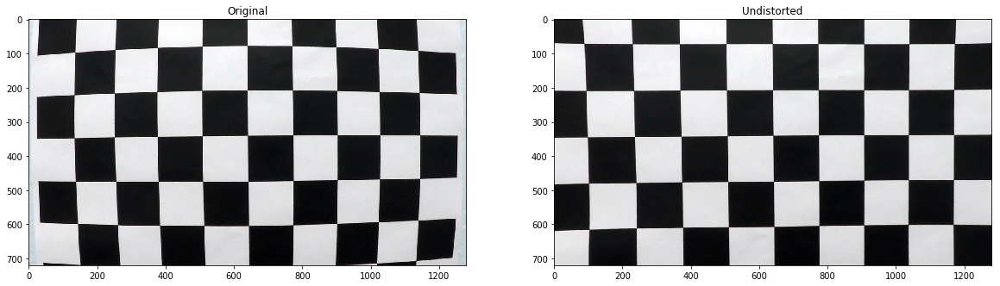

In [28]:
'''
This function undistorts a given image

User has the option of displaying the image and saving the model as well

'''

def display_images(img1, img2, title1, title2, gray=False, gray1=False):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    
    if gray1:
        ax1.imshow(img1, cmap='gray')
    else:
        ax1.imshow(img1)
    
    ax1.set_title(title1)
    
    if gray:
        ax2.imshow(img2, cmap='gray')
    else:
        ax2.imshow(img2)
    ax2.set_title(title2)
    plt.show()

def save_step(obj, title):
    dt = date.today()
    tstr = time.strftime("%H%M%S", time.gmtime(666))
    pickle.dump( obj, open( '%s_%s_%s_%s_%s.pkl' % (title, dt.month, dt.day, dt.year, tstr), "wb" ) )
    
def get_image(file_name):
    img = cv2.imread(file_name)
    return img
    
def undistort(img, display=True, save=True):
    img_size = (img.shape[1], img.shape[0])

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)                 
                     
    if display:
        display_images(img, dst, 'Original', 'Undistorted')
    if save:
        save_step({"mtx": mtx, "dist": dist}, 'undistort')
    return dst


result = undistort(get_image('./camera_cal/calibration1.jpg'), True, False)

In [13]:
def get_perspective_transform_points(img, display = True):
    h, w= (img.shape[0], img.shape[1])

    src = np.float32([(600,450),(750,454), (250,680), (1100,680)])
    dst = np.float32([(450,0),(w-450,0),(450,h),(w-450,h)])
    
    if display:
        x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
        y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
        plt.plot(x, y, color='blue', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
        plt.imshow(img)
        plt.title("Perspective Transform Region")
        plt.show()
    return src, dst

In [14]:
def perspective_transform(img, src_pts, dest_pts, display=True, save=True):
    img_size = (img.shape[1], img.shape[0])
    
    M = cv2.getPerspectiveTransform(src_pts, dest_pts)
    
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    if display:
        display_images(img, warped, "Original", "Perspective Transform")
    
    if save:
        save_step({"M": M}, "perspective_transform")
    return warped, M

In [15]:
def abs_sobel_thresh(img, orient='x', thresh_min=25, thresh_max=255, display=True):
    # 1) Convert to grayscale === or LAB L channel
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobel = cv2.Sobel(gray, cv2.CV_64F, orient=='x', orient=='y')
    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    if display:
        display_images(img, sxbinary, "Original", "Absolute Sobel", True)
    return sxbinary

In [16]:
def mag_thresh(img, sobel_kernel=25, mag_thresh=(25, 255), display=True):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Calculate the magnitude 
    mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    # 5) Create a binary mask where mag thresholds are met
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = np.copy(sxbinary) 
    
    if display:
        display_images(img, binary_output, "Original", "Sobel with magnitude threshold", True)
    return binary_output

In [17]:
def dir_threshold(img, sobel_kernel=7, thresh=(0, 0.09), display=True):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    abs_sobely = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))

    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    graddir = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(graddir)
    # 6) Return this mask as your binary_output image
    binary_output[(graddir >= thresh[0]) & (graddir <= thresh[1])] = 1
    
    if display:
        display_images(img, binary_output, "Original", "Sobel with direction threshold", True)
    return binary_output

In [25]:
def combined_thresholds(grad, mag_binary, dir_binary, display=True ):
    combined = np.zeros_like(dir_binary)
    combined[ (grad == 1) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    if display:
        display_images(img, combined, "Original", "Combined Sobel Image", True)
    return combined

In [61]:
def threshold_color(img, transform, thresh=(0, 255), display=True):
    # 3) Return a binary image of threshold result
    binary_output = np.zeros_like(img)
    binary_output[(img> thresh[0]) & (img<=thresh[1])] = 1
    
    if display:
        display_images(img, binary_output, transform+" Transform ", transform+" Transform With Threshold", True, True)
    return binary_output


def hls_select(img, idx, transform, display=True):
    hlsimg = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    color_output = hlsimg[:,:,idx]
    
    if display:
        display_images(img, color_output, "Original", transform+" Transform", True)
    return color_output


def lab_select(img, idx, transform, display=True):
    labimg = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    color_output = labimg[:,:,idx]

    if display:
        display_images(img, color_output, "Original", transform+" Transform", True)
    return color_output


def rgb_select(img, idx, transform, display=True):
    color_output = img[:,:,idx]
    
    if display:
        display_images(img, color_output, "Original", transform+" Transform", True)
    return color_output

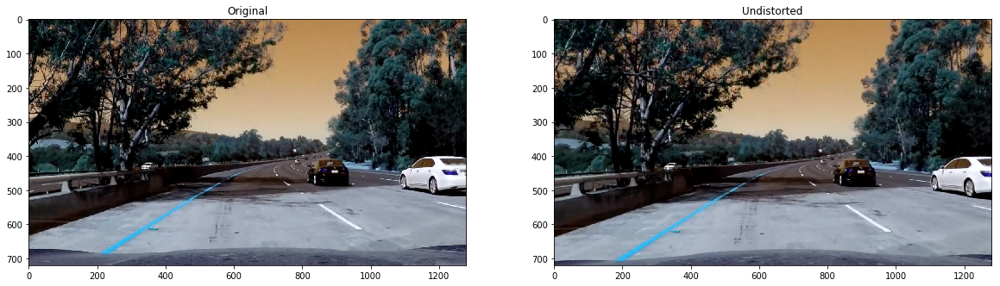

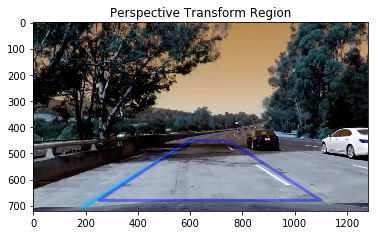

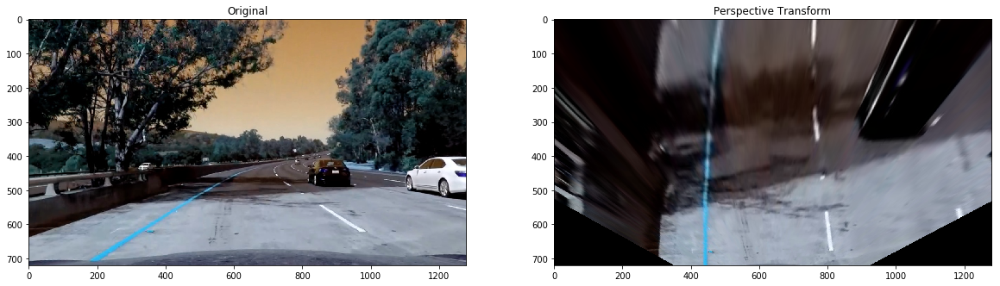

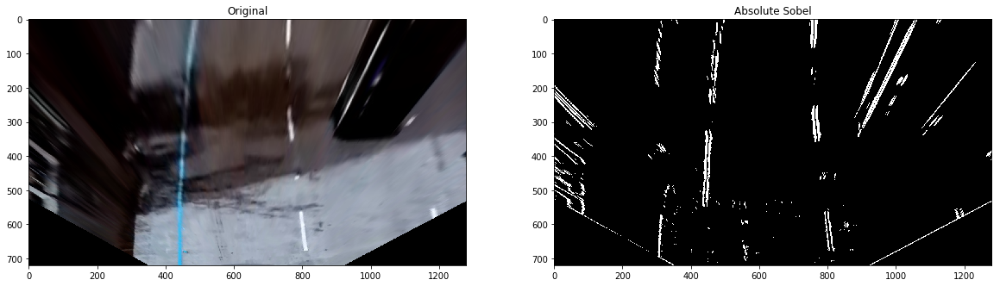

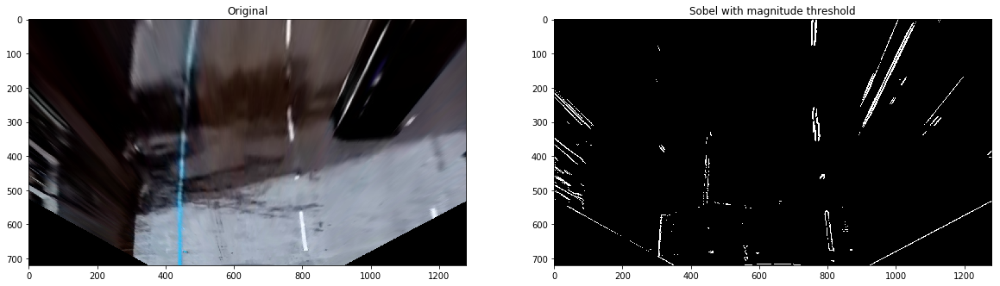

...

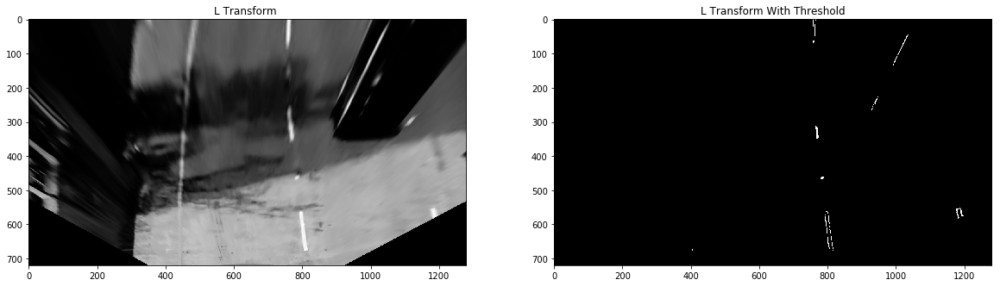

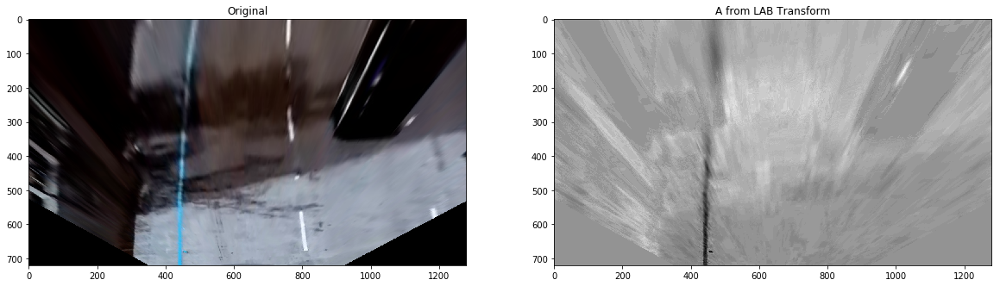

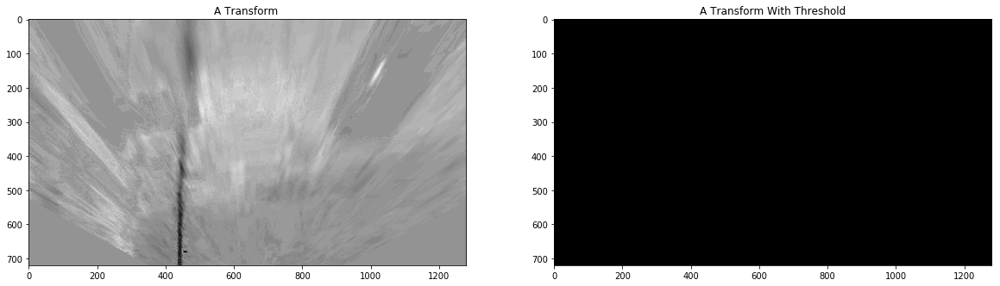

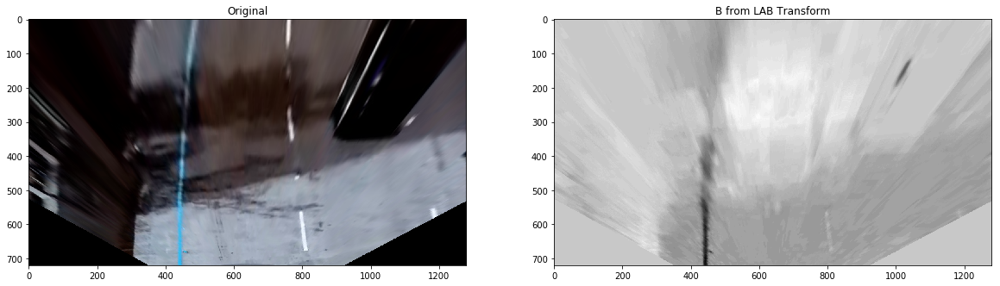

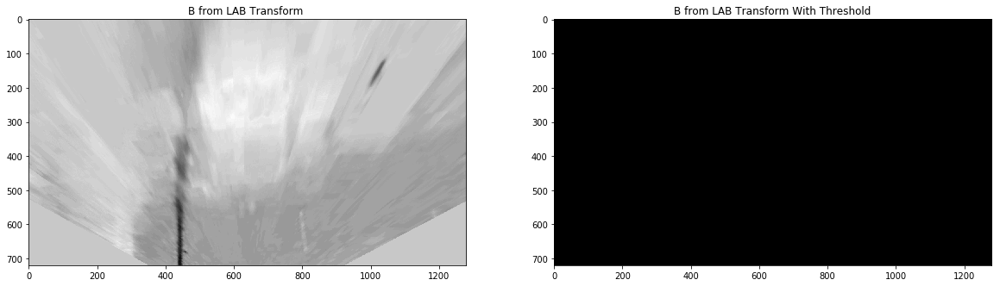

In [70]:
filename = './test_images/test5.jpg'
img = get_image(filename)
undistorted_img = undistort(img, True, False)
src_pts, dest_pts = get_perspective_transform_points(undistorted_img)
perspective_img, M = perspective_transform(undistorted_img, src_pts, dest_pts)
binary_output_img_1 = abs_sobel_thresh(perspective_img)
binary_output_img_2 = mag_thresh(perspective_img)
binary_output_img_3 = dir_threshold(perspective_img)
combined_output_img = combined_thresholds(binary_output_img_1, binary_output_img_2, binary_output_img_3)

h_img = threshold_color(hls_select(perspective_img, 0, "H"), "H", (15, 100))
l_img = threshold_color(hls_select(perspective_img, 1, "L"), "L", (220, 255))
s_img = threshold_color(hls_select(perspective_img, 2, "S"), "S", (125, 255))


r_img = threshold_color(rgb_select(perspective_img, 0, "R"), "R", (200, 255))
g_img = threshold_color(rgb_select(perspective_img, 1, "G"), "G", (125, 200))
b_img = threshold_color(rgb_select(perspective_img, 2, "B"), "B", (0, 125))

L_img = threshold_color(lab_select(perspective_img, 0, "L from LAB"), "L", (200,230))
A_img = threshold_color(lab_select(perspective_img, 1, "A from LAB"), "A", (200,230))
b_img_2 = threshold_color(lab_select(perspective_img, 2, "B from LAB"), "B from LAB", (200,230))

./test_images/test5.jpg


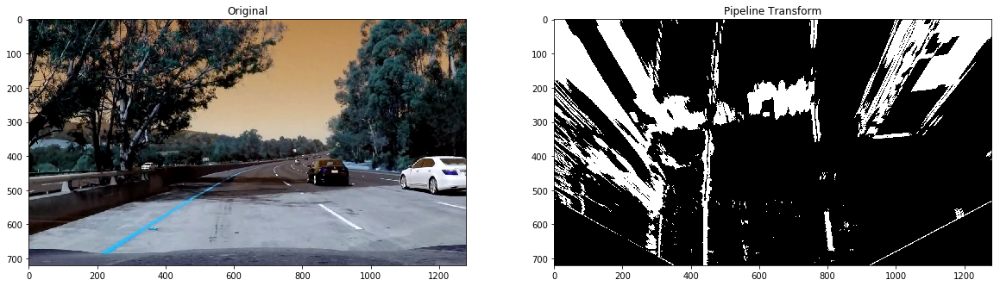

./test_images/straight_lines1.jpg


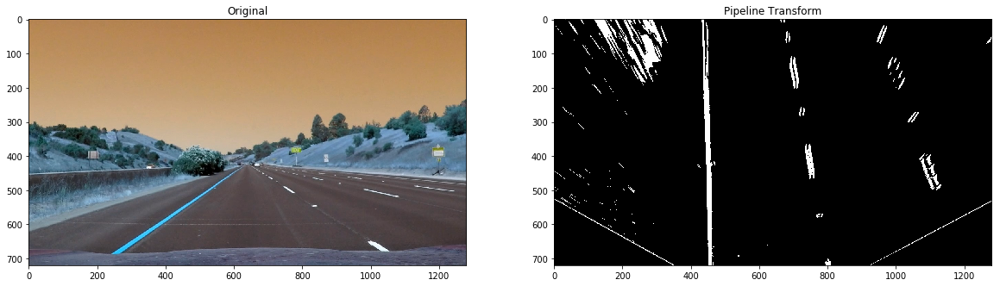

./test_images/test1.jpg


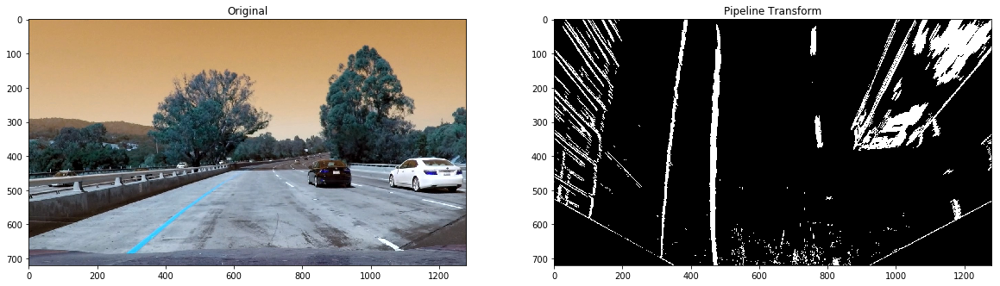

./test_images/test6.jpg


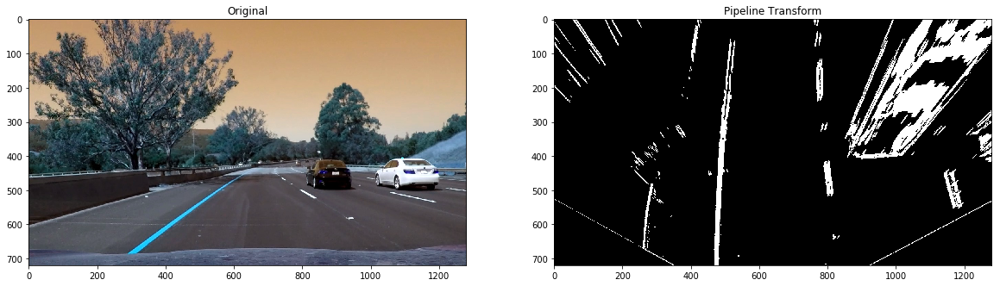

./test_images/test2.jpg


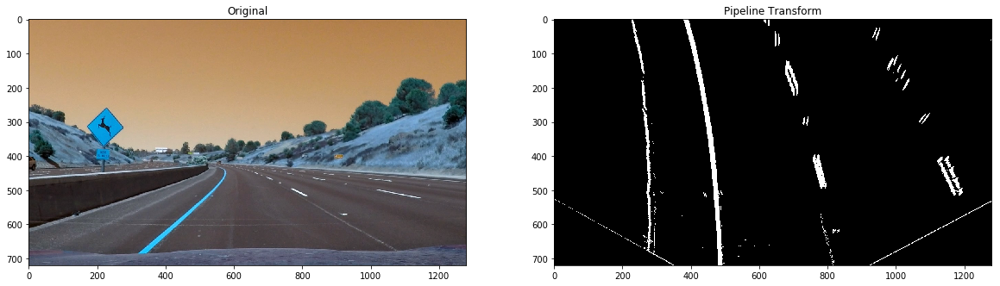

./test_images/straight_lines2.jpg


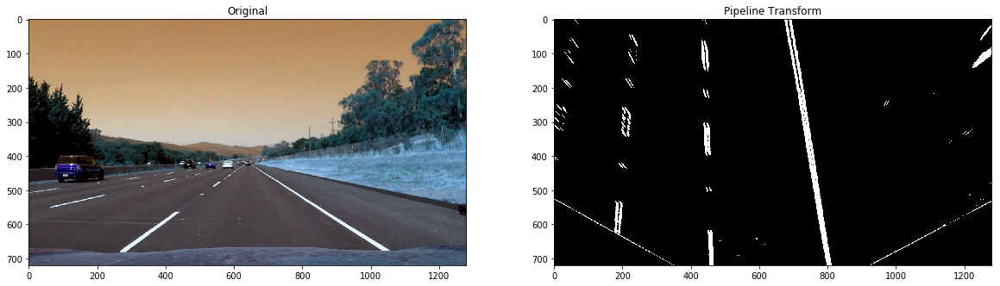

./test_images/test4.jpg


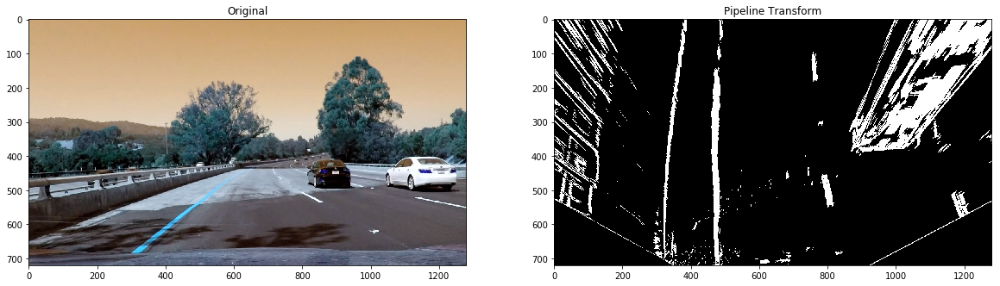

./test_images/test3.jpg


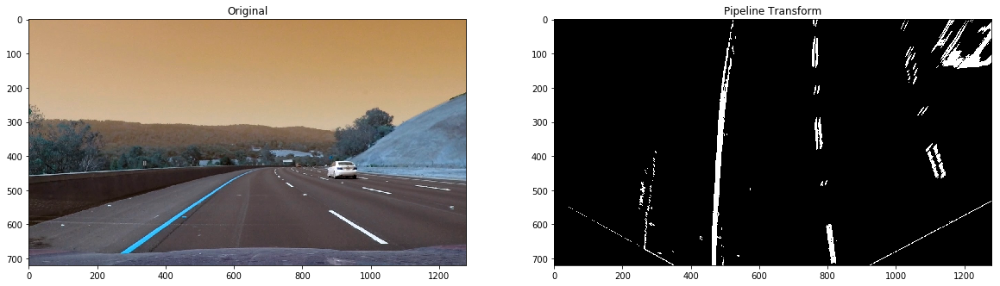

In [69]:
def pipeline(filename):
    img = get_image(filename)
    undistorted_img = undistort(img, display=False, save=False)
    src_pts, dest_pts = get_perspective_transform_points(undistorted_img, display=False)
    
    perspective_img, M = perspective_transform(undistorted_img, src_pts, dest_pts, display=False)
    
    binary_output_img_1 = abs_sobel_thresh(perspective_img, display=False)
    binary_output_img_2 = mag_thresh(perspective_img, display=False)
    binary_output_img_3 = dir_threshold(perspective_img, display=False)
    binary_output_4 = combined_thresholds(binary_output_img_1, binary_output_img_2, binary_output_img_3, display=False )
    
    s_img = threshold_color(hls_select(perspective_img, 2, "S", display=False), "S", (125, 255), display=False)
    
    result = np.zeros_like(binary_output_img_1)
    result[(binary_output_img_1 == 1) | (s_img == 1)] = 1
    return result


test_image_directory = './test_images'
for idx, fname in enumerate(os.listdir(test_image_directory)):
    fpath = test_image_directory+"/"+fname
    print(fpath)
    output_img = pipeline(fpath)
    display_images(get_image(fpath), output_img, "Original", "Pipeline Transform", True)